In [1]:
import keras, cv2
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import *
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import Sequence, to_categorical, array_to_img
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint,ReduceLROnPlateau,TensorBoard, Callback
from tensorflow.keras.optimizers import Adam, Optimizer
import keras.backend as K
from tensorflow.keras.models import Model
import tensorflow as tf
import pickle
from sklearn.model_selection import train_test_split

%matplotlib inline
import matplotlib.pylab as plt
import seaborn as sns
sns.set(rc={"figure.figsize":(12,10)})
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
sns.set_style("whitegrid")
import numpy as np
import pandas as pd
import os, glob, sys
import warnings
warnings.filterwarnings("ignore")

# Data

In [2]:
def sort_human(strings):
    def atoi(text):
        return int(text) if text.isdigit() else text
    
    def human_keys(text):
        import re
        return [ atoi(c) for c in re.split('(\d+)', text) ]
    
    strings.sort(key=human_keys)
    return strings

def import_image(filename, scale=True, expand=None, verbose=True):
    from skimage.io import imread, imsave

    if(filename.endswith('.tif')):
        image=imread(filename, plugin='tifffile')
    else:
        image=imread(filename)
    if scale:
        if image.dtype==np.bool:
            image=image.astype('float32')
        elif image.dtype==np.int8:
            image=(image.astype('float32')+(2**8/2))/(2**8-1)
        elif image.dtype==np.int16:
            image=(image.astype('float32')+(2**16/2))/(2**16-1)
        elif image.dtype==np.uint8:
            image=image.astype('float32')/(2**8-1)
        elif image.dtype==np.uint16:
            image=image.astype('float32')/(2**16-1)
        else:
            warnings.warn('Scaling for dtype {} is not yet implemented!'.format(image.dtype))
    if expand!=None:
        image=np.expand_dims(image,axis=expand)
    if verbose:
        image_info(image)
    return image

def draw_model(model):
    try: 
        import graphviz
        from IPython.display import display,SVG
        from keras.utils.vis_utils import model_to_dot
        return SVG(model_to_dot(model, 
                                show_shapes=False, 
                                show_layer_names=False, 
                                rankdir='LR').create(prog='dot', format='svg'))
    except:
        raise ImportError('Graphviz not installed.')

In [3]:
# data path
data_folder =  r'F:\Touchingcell\Data\original'

# size of images for prediction
HEIGHT, WIDTH = 512,512

# size of image patches for training
PATCH_HEIGHT, PATCH_WIDTH = 512,512

In [4]:
fns_images = sort_human(glob.glob(os.path.join(data_folder, '*_*.bmp')))
fns_masks  = sort_human(glob.glob(os.path.join(data_folder, '*_*_anno.bmp')))

# remove _anno.bmp from path_images
fns_images = sort_human(list(set(fns_images) - set(fns_masks)))

In [5]:
from skimage import transform

images=[]
for fn in fns_images:
    image = import_image(fn, scale=True, verbose=False)
    image = transform.resize(image, (HEIGHT, WIDTH), mode='constant')
    images.append(image)
images = np.array(images, np.float32)
print(images.shape, images.min(), images.max())

masks=[]
for fn in fns_masks:
    basename = os.path.splitext(os.path.basename(fn))[0].split('_anno')[0]
    image = import_image(fn, verbose=False)
    image = transform.resize(image, (HEIGHT, WIDTH), order=0, mode='constant')
    mask = np.array(image>0, np.uint8)
    mask = mask[..., np.newaxis]
    masks.append(mask)
    
masks = np.array(masks)

print(len(np.unique(masks)))

print(images.shape)
print(images.dtype)
print(masks.shape)
print(masks.dtype)
print(type(images), type(masks))

(85, 512, 512, 3) 0.0 1.0
2
(85, 512, 512, 3)
float32
(85, 512, 512, 1)
uint8
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [6]:
# train, validation, test split
x_train, x_test, y_train, y_test = train_test_split(images, masks, test_size=.10, random_state=777)
x_train, x_validation, y_train, y_validation = train_test_split(x_train, y_train, test_size=.2, random_state=777)

print('X training: {}'.format(x_train.shape))
print('X validation: {}'.format(x_validation.shape))
print('X test: {}'.format(x_test.shape))
print()
print('Y training: {}'.format(y_train.shape))
print('Y validation: {}'.format(y_validation.shape))
print('Y test: {}'.format(y_test.shape))
print()

print(x_train.dtype, y_train.dtype)
print(type(x_train), type(y_train))
print(x_validation.dtype, y_validation.dtype)
print(type(x_validation), type(y_validation))
print(x_test.dtype, y_test.dtype)
print(type(x_test), type(y_test))

X training: (60, 512, 512, 3)
X validation: (16, 512, 512, 3)
X test: (9, 512, 512, 3)

Y training: (60, 512, 512, 1)
Y validation: (16, 512, 512, 1)
Y test: (9, 512, 512, 1)

float32 uint8
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
float32 uint8
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
float32 uint8
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


# U-Net model

In [7]:
def UNet(n_input_channels, n_output_channels):
    inputs = Input((None, None, n_input_channels))
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    conv4 = BatchNormalization()(conv4)
#     drop4 = Dropout(0.5)(conv4)
    drop4 = Dropout(0.3)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    conv5 = BatchNormalization()(conv5)
#     drop5 = Dropout(0.5)(conv5)
    drop5 = Dropout(0.3)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
    merge6 = Concatenate(axis=-1)([conv4,up6])
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)
    conv6 = BatchNormalization()(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = Concatenate(axis=-1)([conv3,up7])
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)
    conv7 = BatchNormalization()(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = Concatenate(axis=-1)([conv2,up8])
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = BatchNormalization()(conv8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)
    conv8 = BatchNormalization()(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = Concatenate(axis=-1)([conv1,up9])
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = BatchNormalization()(conv9)
    conv10 = Conv2D(n_output_channels, 1, activation = 'sigmoid')(conv9)
    
    return Model(inputs = inputs, outputs = conv10)

In [8]:
model_unet = UNet(n_input_channels=3, n_output_channels=1)
print('UNet: {:,} params'.format(model_unet.count_params()))
model_unet.summary()

UNet: 31,056,397 params
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 6 1792        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 6 256         conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 6 36928       batch_normalization[0][0]        
______________________________________________________________________

# Loss Function

In [37]:
from keras import layers as KL
import keras.backend as K

def Combo_loss(y_true, y_pred, smooth=1):
    e = K.epsilon()
    if y_pred.shape[-1] <= 1:
        ALPHA = 0.8    # < 0.5 penalises FP more, > 0.5 penalises FN more
        CE_RATIO = 0.5 # weighted contribution of modified CE loss compared to Dice loss
        y_pred = tf.keras.activations.sigmoid(y_pred)
    elif y_pred.shape[-1] >= 2:
        ALPHA = 0.3    # < 0.5 penalises FP more, > 0.5 penalises FN more
        CE_RATIO = 0.7 # weighted contribution of modified CE loss compared to Dice loss
        y_pred = tf.keras.activations.softmax(y_pred, axis=-1)
        y_true = K.squeeze(y_true, 3)
        y_true = tf.cast(y_true, "int32")
        y_true = tf.one_hot(y_true, num_class, axis=-1)
 
 # cast to float32 datatype
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')

    targets = K.flatten(y_true)
    inputs = K.flatten(y_pred)

    intersection = K.sum(targets * inputs)
    dice = (2. * intersection + smooth) / (K.sum(targets) + K.sum(inputs) + smooth)
    inputs = K.clip(inputs, e, 1.0 - e)
    out = - (ALPHA * ((targets * K.log(inputs)) + ((1 - ALPHA) * (1.0 - targets) * K.log(1.0 - inputs))))
    weighted_ce = K.mean(out, axis=-1)
    combo = (CE_RATIO * weighted_ce) - ((1 - CE_RATIO) * dice)

    return combo

def FocalTverskyLoss(y_true, y_pred, smooth=1e-6):
    if y_pred.shape[-1] <= 1:
        alpha = 0.3
        beta = 0.7
        gamma = 4/3 #5.
        y_pred = tf.keras.activations.sigmoid(y_pred)
        #y_true = y_true[:,:,:,0:1]
    elif y_pred.shape[-1] >= 2:
        alpha = 0.3
        beta = 0.7
        gamma = 4/3 #3.
        y_pred = tf.keras.activations.softmax(y_pred, axis=-1)
        y_true = K.squeeze(y_true, 3)
        y_true = tf.cast(y_true, "int32")
        y_true = tf.one_hot(y_true, num_class, axis=-1)

    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    #flatten label and prediction tensors
    inputs = K.flatten(y_pred)
    targets = K.flatten(y_true)

    #True Positives, False Positives & False Negatives
    TP = K.sum((inputs * targets))
    FP = K.sum(((1-targets) * inputs))
    FN = K.sum((targets * (1-inputs)))

    Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
    FocalTversky = K.pow((1 - Tversky), gamma)

    return FocalTversky


#Tensorflow / Keras
def DiceBCELoss(y_true, y_pred, smooth=1e-6):    
    
    # if you are using this loss for multi-class segmentation then uncomment 
    # following lines
    # if y_pred.shape[-1] <= 1:
    #     # activate logits
    #     y_pred = tf.keras.activations.sigmoid(y_pred)
    # elif y_pred.shape[-1] >= 2:
    #     # activate logits
    #     y_pred = tf.keras.activations.softmax(y_pred, axis=-1)
    #     # convert the tensor to one-hot for multi-class segmentation
    #     y_true = K.squeeze(y_true, 3)
    #     y_true = tf.cast(y_true, "int32")
    #     y_true = tf.one_hot(y_true, num_class, axis=-1)
    
    # cast to float32 datatype
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    
    #flatten label and prediction tensors
    inputs = K.flatten(y_pred)
    targets = K.flatten(y_true)
    
    BCE =  tf.keras.losses.binary_crossentropy(targets, inputs)
#     intersection = K.sum(K.dot(targets, inputs))
    intersection = K.sum(targets*inputs)
    dice_loss = 1 - (2*intersection + smooth) / (K.sum(targets) + K.sum(inputs) + smooth)
    Dice_BCE = BCE + dice_loss
    
    return Dice_BCE

def soft_dilate(img):
    """[This function performs soft-dilation operation on a float32 image]
    Args:
        img ([float32]): [image to be soft dialated]
    Returns:
        [float32]: [the dialated image]
    """
    return KL.MaxPool2D(pool_size=(3, 3), strides=(1, 1), padding='same', data_format=None)(img)

def soft_erode(img):
    """[This function performs soft-erosion operation on a float32 image]
    Args:
        img ([float32]): [image to be soft eroded]
    Returns:
        [float32]: [the eroded image]
    """
    # 3D -> 2D로 변경
#     p1 = -KL.MaxPool3D(pool_size=(3, 3, 1), strides=(1, 1, 1), padding='same', data_format=None)(-img)
#     p2 = -KL.MaxPool3D(pool_size=(3, 1, 3), strides=(1, 1, 1), padding='same', data_format=None)(-img)
#     p3 = -KL.MaxPool3D(pool_size=(1, 3, 3), strides=(1, 1, 1), padding='same', data_format=None)(-img)
    p1 = -KL.MaxPool2D(pool_size=(3, 1), strides=(1, 1), padding='same', data_format=None)(-img)
    p2 = -KL.MaxPool2D(pool_size=(1, 3), strides=(1, 1), padding='same', data_format=None)(-img)
    return tf.math.minimum(p1, p2)
#     return tf.math.minimum(tf.math.minimum(p1, p2), p3)

def soft_open(img):
    """[This function performs soft-open operation on a float32 image]
    Args:
        img ([float32]): [image to be soft opened]
    Returns:
        [float32]: [image after soft-open]
    """
    img = soft_erode(img)
    img = soft_dilate(img)
    return img

def soft_skel(img, iters):
    """[summary]
    Args:
        img ([float32]): [description]
        iters ([int]): [description]
    Returns:
        [float32]: [description]
    """
    img1 = soft_open(img)
    skel = tf.nn.relu(img-img1)

    for j in range(iters):
        img = soft_erode(img)
        img1 = soft_open(img)
        delta = tf.nn.relu(img-img1)
        intersect = tf.math.multiply(skel, delta)
        skel += tf.nn.relu(delta-intersect)
    return skel

# Focal loss
def focal_loss_with_logits(logits, targets, y_pred, alpha=0.25, gamma=2):
    weight_a = alpha * (1 - y_pred) ** gamma * targets
    weight_b = (1 - alpha) * y_pred ** gamma * (1 - targets)

    return (tf.math.log1p(tf.exp(-tf.abs(logits))) + tf.nn.relu(-logits)) * (weight_a + weight_b) + logits * weight_b

def focal_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    
    y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
    logits = tf.math.log(y_pred / (1 - y_pred))

    loss = focal_loss_with_logits(logits=logits, targets=y_true, y_pred=y_pred)

    return tf.reduce_mean(loss)

# Tversky loss
def tversky_index(y_true, y_pred):
    smooth = 1
    alpha = 0.25
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    return 1 - tversky_index(y_true, y_pred)

# weighted cross entropyloss
beta = 0.25
def convert_to_logits(y_pred):
    y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(),
                              1 - tf.keras.backend.epsilon())
    return tf.math.log(y_pred / (1 - y_pred))

def weighted_cross_entropyloss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    
    y_pred = convert_to_logits(y_pred)
    pos_weight = beta / (1 - beta)
    
    loss = tf.nn.weighted_cross_entropy_with_logits(logits=y_pred,
                                                    labels=y_true,
                                                    pos_weight=pos_weight)
    return tf.reduce_mean(loss)

def dice_loss(data_format="channels_first"):
    """dice loss function for tensorflow/keras
        calculate dice loss per batch and channel of each sample.
    Args:
        data_format: either channels_first or channels_last
    Returns:
        loss_function(y_true, y_pred)  
    """

    def loss(target, pred):
        if data_format == "channels_last":
            pred = tf.transpose(pred, (0, 3, 1, 2))
            target = tf.transpose(target, (0, 3, 1, 2))
        
        smooth = 1.0
        iflat = tf.reshape(
            pred, (tf.shape(pred)[0], tf.shape(pred)[1], -1)
        )  # batch, channel, -1
        tflat = tf.reshape(target, (tf.shape(target)[0], tf.shape(target)[1], -1))
        intersection = K.sum(iflat * tflat, axis=-1)
        return 1 - ((2.0 * intersection + smooth)) / (
            K.sum(iflat, axis=-1) + K.sum(tflat, axis=-1) + smooth
        )

    return loss

def soft_skeletonize(x, thresh_width=10):
    """
    Differenciable aproximation of morphological skelitonization operaton
    thresh_width - needs to be greater then or equal to the maximum radius for the tube-like structure
    """

    minpool = (
        lambda y: K.pool2d(
            y * -1,
            pool_size=(3, 3),
            strides=(1, 1),
            pool_mode="max",
            data_format="channels_first",
            padding="same",
        )
        * -1
    )
    maxpool = lambda y: K.pool2d(
        y,
        pool_size=(3, 3),
        strides=(1, 1),
        pool_mode="max",
        data_format="channels_first",
        padding="same",
    )

    for i in range(thresh_width):
        min_pool_x = minpool(x)
        contour = K.relu(maxpool(min_pool_x) - min_pool_x)
        x = K.relu(x - contour)
    return x

def norm_intersection(center_line, vessel):
    """
    inputs shape  (batch, channel, height, width)
    intersection formalized by first ares
    x - suppose to be centerline of vessel (pred or gt) and y - is vessel (pred or gt)
    """
    smooth = 1.0
    clf = tf.reshape(
        center_line, (tf.shape(center_line)[0], tf.shape(center_line)[1], -1)
    )
    vf = tf.reshape(vessel, (tf.shape(vessel)[0], tf.shape(vessel)[1], -1))
    intersection = K.sum(clf * vf, axis=-1)
    return (intersection + smooth) / (K.sum(clf, axis=-1) + smooth)

def soft_cldice_loss(target, pred, data_format="channels_first"):
    k = 2
    
    target = K.cast(target, 'float32')
    pred = K.cast(pred, 'float32')
    
    if data_format == "channels_last":
        pred = tf.transpose(pred, (0, 3, 1, 2))
        target = tf.transpose(target, (0, 3, 1, 2))

    cl_pred = soft_skeletonize(pred, thresh_width=k)
    target_skeleton = soft_skeletonize(target, thresh_width=k)
    iflat = norm_intersection(cl_pred, target)
    tflat = norm_intersection(target_skeleton, pred)
    intersection = iflat * tflat
    return 1 - ((2.0 * intersection) / (iflat + tflat))

# Training

In [21]:
from IPython.display import clear_output
from keras.callbacks import Callback
class PlotLearning(Callback):

    def on_train_begin(self, logs={}):
        self.i = 0
        self.x = []
        self.loss = []
        self.val_loss = []
        self.iou = []
        self.val_iou = []
        self.dice_coef = []
        self.val_dice_coef = []
        self.weighted_hausdorff_distance = []
        self.val_weighted_hausdorff_distance = []
        self.fig = plt.figure()
        
        self.logs = []

    def on_epoch_end(self, epoch, logs={}):
#         clear_output(wait=True)
        self.logs.append(logs)
        self.x.append(self.i)
        self.loss.append(logs.get('loss'))
        self.iou.append(logs.get('iou_score'))
        self.dice_coef.append(logs.get('dice_coef'))
        self.weighted_hausdorff_distance.append(logs.get('weighted_hausdorff_distance'))
        
        self.val_loss.append(logs.get('val_loss'))        
        self.val_iou.append(logs.get('val_iou_score'))
        self.val_dice_coef.append(logs.get('val_dice_coef'))
        self.val_weighted_hausdorff_distance.append(logs.get('val_weighted_hausdorff_distance'))
        
        self.i += 1
        f, ax = plt.subplots(1, 3, figsize=(15,8), sharex=True)
        ax = ax.flatten()
        clear_output(wait=True)
        
        ax[0].plot(self.x, self.loss, label="loss", lw=2)
        ax[0].plot(self.x, self.val_loss, label="val_loss")
        ax[0].legend()
        ax[0].grid(True)
        
        ax[1].plot(self.x, self.iou, label="iou_score", lw=2)
        ax[1].plot(self.x, self.val_iou, label="val_iou_score")
        ax[1].legend()
        ax[1].grid(True)
        
        ax[2].plot(self.x, self.dice_coef, label="dice_coef", lw=2)
        ax[2].plot(self.x, self.val_dice_coef, label="val_dice_coef")
        ax[2].legend()
        ax[2].grid(True)
        plt.show()
        
plotLoss = PlotLearning()

In [22]:
batchsize = 2
epochs = 50
reload = False
Number_L = 6
number = '10'

## Metrics ( IoU, Dice_coef )

In [23]:
import segmentation_models as sm
import tensorflow as tf
import tensorflow.keras.backend as K
import numpy as np
from sklearn.utils.extmath import cartesian
import math


metrics = sm.metrics.IOUScore(threshold=0.50)

def dice_coef(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def cdist(A, B):
    """
    Computes the pairwise Euclidean distance matrix between two tensorflow matrices A & B, similiar to scikit-learn cdist.
    For example:
    A = [[1, 2],
         [3, 4]]
    B = [[1, 2],
         [3, 4]]
    should return:
        [[0, 2.82],
         [2.82, 0]]
    :param A: m_a x n matrix
    :param B: m_b x n matrix
    :return: euclidean distance matrix (m_a x m_b)
    """
    # squared norms of each row in A and B
    na = tf.reduce_sum(tf.square(A), 1)
    nb = tf.reduce_sum(tf.square(B), 1)

    # na as a row and nb as a co"lumn vectors
    na = tf.reshape(na, [-1, 1])
    nb = tf.reshape(nb, [1, -1])

    # return pairwise euclidead difference matrix
    D = tf.sqrt(tf.maximum(na - 2 * tf.matmul(A, B, False, True) + nb, 0.0))
    return D

## Train model

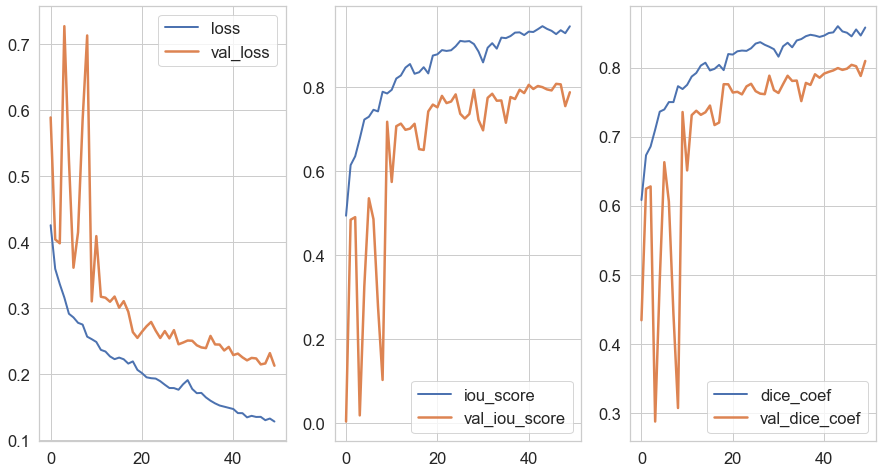


Epoch 00050: val_loss improved from 0.21513 to 0.21314, saving model to model_unet_base.h5


In [38]:
for i_L in range(0,7):
    model_unet = UNet(n_input_channels=3, n_output_channels=1)
    print('UNet: {:,} params'.format(model_unet.count_params()))
    # model_unet.summary()

    adam = tf.keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
    model_name = "model_unet_base.h5"
    checkpoint = ModelCheckpoint(model_name, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    reduce_lr_on_plateau = ReduceLROnPlateau(monitor = 'val_loss',patience = 5, factor=0.3, verbose=1)
    new_save_path = r"F:\Touchingcell\Data\model_save_folder/"
#     metrics = sm.metrics.IOUScore(threshold=0.50)
    
    if i_L == 0:
        loss_name = "Combo_loss"
        loss = Combo_loss
    elif i_L == 1:
        loss_name = "Focal_Tversky_loss"
        loss = FocalTverskyLoss
    elif i_L == 2:
        loss_name = "DiceCE"
        loss = DiceBCELoss
    elif i_L == 3:
        loss_name = "weighted_cross_entropyloss"
        loss = weighted_cross_entropyloss
    elif i_L == 4:
        loss_name = "focal_loss"
        loss = focal_loss
    elif i_L == 5:
        loss_name = "tversky_loss"
        loss = tversky_loss
    elif i_L == 6:
        loss_name = "clDice_loss"
        loss = soft_cldice_loss
    
    print("\n loss_name : ", loss_name)
    print("\n")
    
    model_unet.compile(optimizer=adam, loss=loss, metrics=[metrics, dice_coef])

    history_unet = model_unet.fit(x_train, y_train, batch_size=batchsize, epochs=epochs, 
                        verbose=1, shuffle=True,
                        validation_data=(x_validation, y_validation),
                        callbacks=[plotLoss,checkpoint,reduce_lr_on_plateau])
    
    model_unet.save(new_save_path + loss_name + '_U_net_' + number + '.h5')
    
    with open(new_save_path + loss_name + number, 'wb') as file_pi:
        pickle.dump(history_unet.history, file_pi)

# Predict

In [39]:
def predict(model, num_samples=10, indices=None):
    import time
    import random
    
    tic = time.time()
    if indices is not None:
        samples_ind = indices
        
    predictions = model.predict(x_test, batch_size=4)
    
    toc = time.time()
    print('Time per image = {:.4f} sec'.format((toc-tic) / num_samples))
    return x_test, y_test, predictions

def images_overlay(x, y, threshold=1e-2, title=None, alpha=0.25, cmap='winter_r', ax=None, figsize=(5,5)):
    
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=figsize)
    
    # [] 제거 ( 2차원을 1차원으로 만드는것)
    # 길이가 1인 축을 제거
    x = np.squeeze(x)
    y = np.squeeze(y)

    ax.imshow(x)

    mask = np.ma.masked_less(y, threshold)
    
    ax.contourf(mask >  threshold, alpha=alpha, cmap=cmap)
    ax.contour(y, levels=[threshold], alpha=1.0, cmap=cmap)

    ax.axis('off')
    
    if title is not None:
        ax.set_title(title, fontsize=28)
        
def plot_prediction(x, y, y_pred_unet, sample):
    
    if sample >= len(y_pred_unet):
        raise ValueError('sample {} does not exist, max = {}'.format(sample, len(y_pred)-1))
    
    for color in y_pred_unet[sample]:
        for index, name in enumerate(color):
            if name < 0.5:
                color[index] = 0
            else:
                color[index] = 1
    
    print("y_pred_unet[sample].shape : ", y_pred_unet[sample].shape)
    print("y.shape : ", y[sample].shape)
    fig, ax = plt.subplots(1,2,figsize=(30,25))
    images_overlay(x[sample], y_pred_unet[sample], ax=ax[0], threshold = 1e-1, title='prediction UNet')
    images_overlay(x[sample], y[sample], ax=ax[1], title='annotation')
    plt.show()

In [41]:
new_save_path

'F:\\Touchingcell\\Data\\model_save_folder/'

clDice_loss_U_net_10.h5
Time per image = 0.6752 sec
(9, 512, 512, 1)
--------------------------------------------------

y_pred_unet[sample].shape :  (512, 512, 1)
y.shape :  (512, 512, 1)


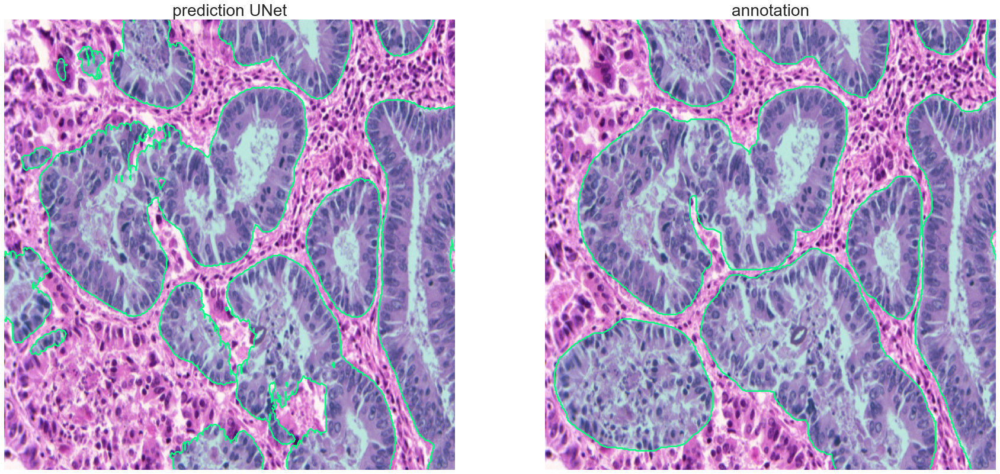

--------------------------------------------------

Combo_loss_U_net_10.h5
Time per image = 0.6800 sec
(9, 512, 512, 1)
--------------------------------------------------

y_pred_unet[sample].shape :  (512, 512, 1)
y.shape :  (512, 512, 1)


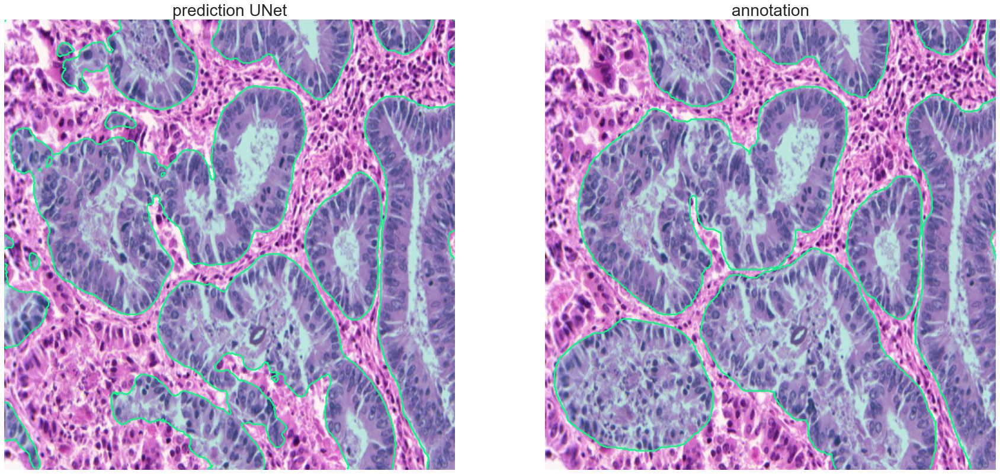

--------------------------------------------------

DiceCE_U_net_10.h5
Time per image = 0.6822 sec
(9, 512, 512, 1)
--------------------------------------------------

y_pred_unet[sample].shape :  (512, 512, 1)
y.shape :  (512, 512, 1)


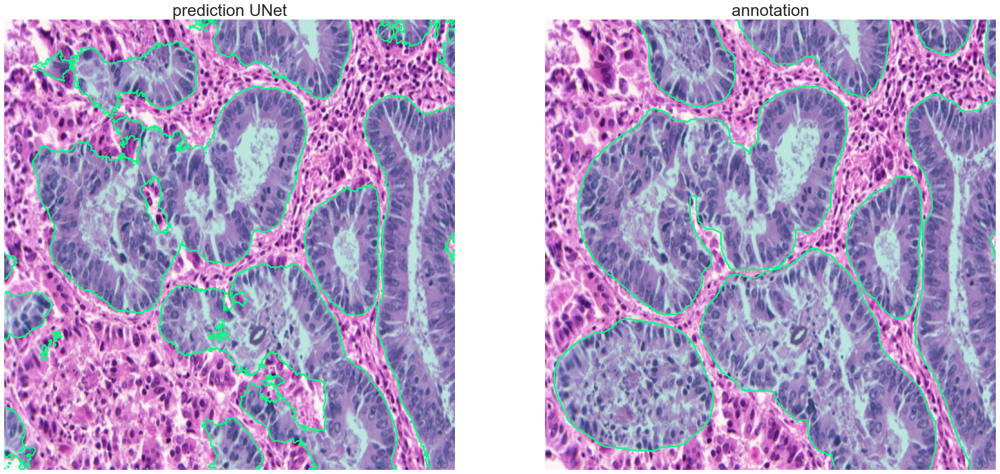

--------------------------------------------------

focal_loss_U_net_10.h5
Time per image = 0.6840 sec
(9, 512, 512, 1)
--------------------------------------------------

y_pred_unet[sample].shape :  (512, 512, 1)
y.shape :  (512, 512, 1)


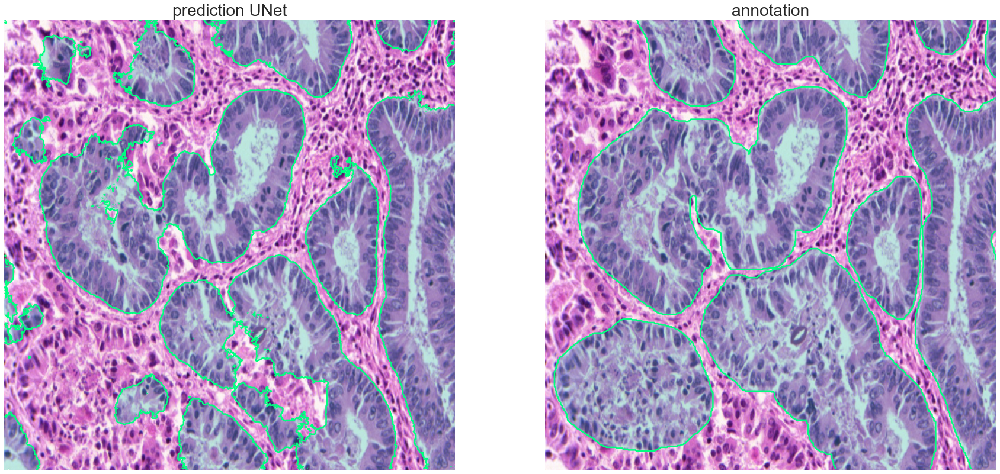

--------------------------------------------------

Focal_Tversky_loss_U_net_10.h5
Time per image = 0.6862 sec
(9, 512, 512, 1)
--------------------------------------------------

y_pred_unet[sample].shape :  (512, 512, 1)
y.shape :  (512, 512, 1)


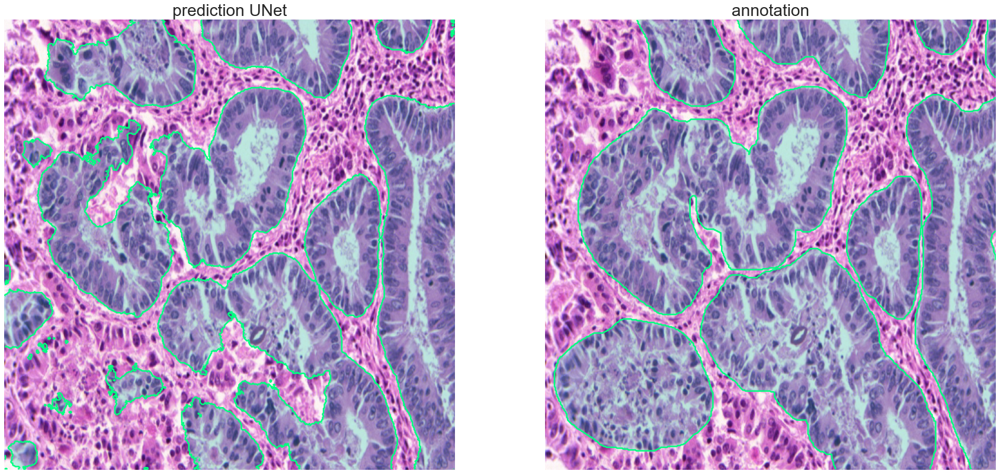

--------------------------------------------------

tversky_loss_U_net_10.h5
Time per image = 0.6869 sec
(9, 512, 512, 1)
--------------------------------------------------

y_pred_unet[sample].shape :  (512, 512, 1)
y.shape :  (512, 512, 1)


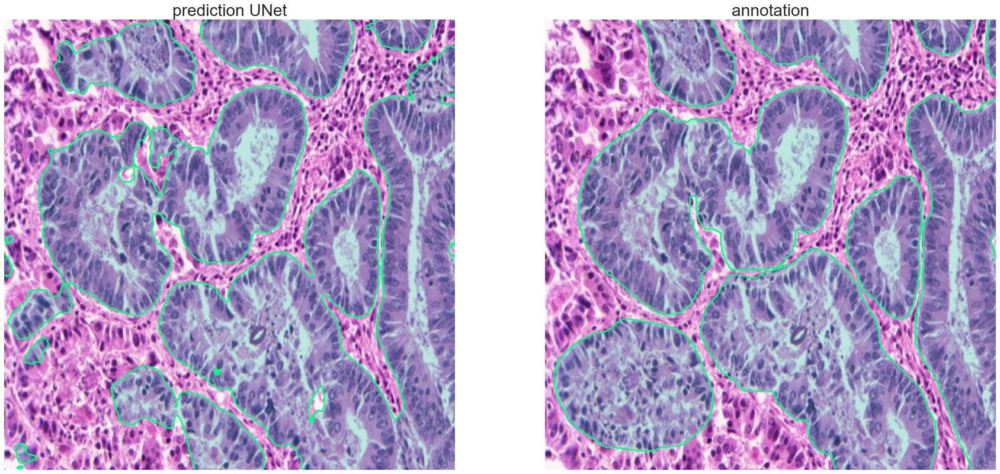

--------------------------------------------------

weighted_cross_entropyloss_U_net_10.h5
Time per image = 0.6873 sec
(9, 512, 512, 1)
--------------------------------------------------

y_pred_unet[sample].shape :  (512, 512, 1)
y.shape :  (512, 512, 1)


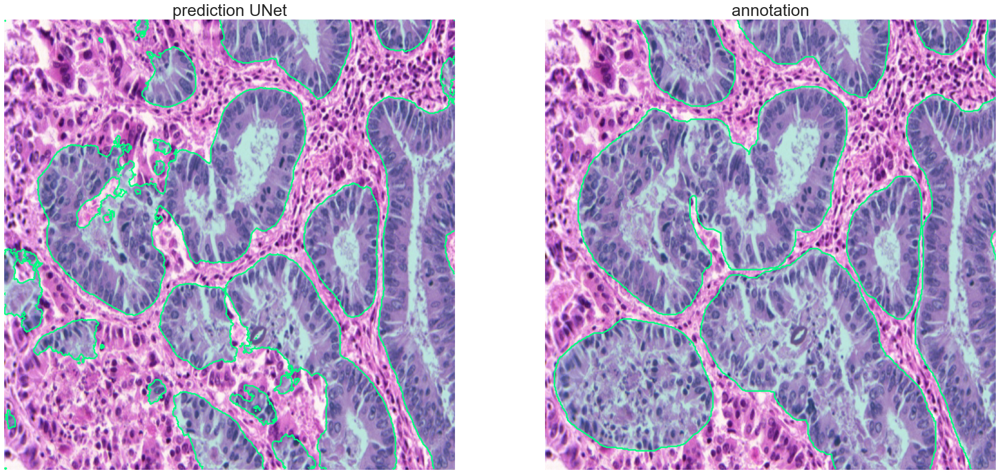

--------------------------------------------------



In [47]:
model_name = ["Combo", "DiceCE", "Focal", "focal", "tversky", "weighted","clDice"]
# you can check 'Number'
model_list = glob.glob(os.path.join(new_save_path, '*10.h5'))

for model in model_list:
    model_name_split = model.split("\\")
    model_name_split2 = model_name_split[-1].split("_")
    print(model_name_split[-1])
    
    if model_name_split2[0] == model_name[0]:
        custom_objects = {"Combo_loss": Combo_loss, "iou_score": metrics, "dice_coef": metrics}
        loss = "Combo"
    elif model_name_split2[0] == model_name[1]:
        custom_objects = {"DiceBCELoss": DiceBCELoss, "iou_score": metrics, "dice_coef": metrics}
        loss = "DiceBCE Loss"
    elif model_name_split2[0] == model_name[2]:
        custom_objects = {"FocalTverskyLoss": FocalTverskyLoss, "iou_score": metrics, "dice_coef": metrics}
        loss = "FocalTverskyLoss"
    elif model_name_split2[0] == model_name[3]:
        custom_objects = {"focal_loss": focal_loss, "iou_score": metrics, "dice_coef": metrics}
        loss = "Focal Loss"
    elif model_name_split2[0] == model_name[4]:
        custom_objects = {"tversky_loss": tversky_loss, "iou_score": metrics, "dice_coef": metrics}
        loss = "Tversky Loss"
    elif model_name_split2[0] == model_name[5]:
        custom_objects = {"weighted_cross_entropyloss": weighted_cross_entropyloss, "iou_score": metrics, "dice_coef": metrics}
        loss = "Weighted Cross Entropyloss"
    elif model_name_split2[0] == model_name[6]:
        custom_objects = {"soft_cldice_loss": soft_cldice_loss, "iou_score": metrics, "dice_coef": metrics} 
        loss = "clDice"

    model_unet = tf.keras.models.load_model(model, custom_objects)    
    
    # 예측 결과 저장 및 출력
    y_pred=model_unet.predict(x_test, batch_size=4) 
    y_pred_argmax=np.argmax(y_pred, axis=3)
    
    # num_samples = y_pred.shape[0] # 모든 test 이미지 출력
    num_samples = 1 # 1개 이미지 출력
    x_data, y_data, y_pred_unet = predict(model_unet, num_samples)
    print(y_pred_unet.shape)
    print("-"*50)
    print()
    
    _ = [plot_prediction(x_data, y_data, y_pred_unet, sample=i) for i in range(num_samples)]
    print("-"*50)
    print()
    
    import random
    n = []
    data = x_test

    ran_num = random.randint(0, len(data)-1)
    for i in range(len(data)):
        while ran_num in n:
            ran_num = random.randint(0, len(data)-1)
        n.append(ran_num)
        
#     for j in n:
#         cv2.imwrite(r"F:\matrix_loss_list4/" + loss + "/binary/" + loss + "_" + str(j) + ".png",
#                     y_pred_unet[j], [cv2.IMWRITE_PNG_BILEVEL, 1])